# Creating grid model with DaVe (full automatic)

This Tutorial will introduce you into the DaVe datastructure and how to create a grid model full automatic through the use of the python console. DaVe is a python based Softwaretool which automaticly collects open data from diffrent datasources and combine them to a energy model. The only informations the user must input are the area and the grid levels which should contained in the model. For a description how DaVe works inside, look at this [master thesis](https://www.researchgate.net/publication/347423392_DaVe_-_Ein_Softwaretool_zur_automatisierten_Generierung_von_regionalspezifischen_Stromnetzen_basierend_auf_Open_Data).

A example python script including the following code you can additionaly find in your DaVe directory under example\test_dave.py

## Import DaVe functions

First, we import the create_grid function from DaVe. For the full automatic way of creating a grid model with DaVe it is the only function we need.  

In [ ]:
from dave.create import create_grid

## Define grid area

It is necessary for DaVe to know the region where the grid model should generate. For that DaVe offers five diffrent ways to input your defined grid area. You have the choise which option is the most suitable for you. **Note:** you can only use one input variatation per function call. 

For a better overview examples for all five Options are given below. 

### 1. Postal codes (for germany)

**Format**: List of strings

In [ ]:
# Examples for postal codes 
postalcode_1 = ['34225']  # Baunatal
postalcode_2 = ['37085', '37075', '37083', '37079', '37081', '37073', '37077']  # Göttingen
postalcode_3 = ['ALL']  # all postal code areas in germany

### 2. Town names (for germany)

**Format**: List of strings

**Note**: The input is not case sensitive

In [ ]:
# Examples for town names
town_name_1 = ['Göttingen']
town_name_2 = ['KAsSel', 'Baunatal'] 
town_name_3 = ['ALL']  # all town names in germany

### 3. Federal states (for germany)

**Format**: List of strings

**Note**: The input is not case sensitive

In [ ]:
# Examples for federal states
federal_state_1 = ['Hessen']
federal_state_2 = ['HeSsEn', 'SchleSWIg-HOLstein']
federal_state_3 = ['ALL']  # all federal states in germany

### 4. Nuts regions (for europe)

**Format**: List of strings

**Note**: You can input all diffrent nuts level and also combine them

In [ ]:
# Examples for nuts regions
nuts_1 = ['DE']  # nuts level 0
nuts_2 = ['DE11A', 'DE11B']  # nuts level 3
nuts_3 = ['DEF', 'DE60']  # example for diffrent nuts level combined (level 1 and level 2)

### 5. Own shape file

**Format**: String 

**Note**: You need to hand over DaVe the absolute path to your shapefile

In [ ]:
# Example for shapefile
import os 
# Hertingshausen is a part from the Town Baunatal. (ca. 500 relevant Buildings)
own_area = os.getcwd()+'\\..\\examples\\hertingshausen\\hertingshausen.shp'  
own_area # show absolute path

## Define grid levels

The second and last necessary input parameter the user must handed over to DaVe is the difinition of the grid levels which should considered. At this time DaVe can generate the topology for all voltage levels in the power sector and for the high pressure level in the gas sector. The plan is that the other gas levels and also heat levels will be follow.

Examples how to define the grid levels are given in the following.

### 1. Power levels

**Format**: List of strings

**Note**: At this time the availible power grid data is restricted to germany. More will following...

The Options for the power grid levels are:
1. EHV (extra high voltage)
2. HV  (high voltage)
3. MV  (medium voltage)
4. LV  (low voltage)

In [ ]:
# Example for power levels
power_level_1 = ['EHV']  
power_level_2 = ['HV', 'MV', 'LV']  
power_level_3 = ['ALL']  # all power levels (EHV, HV, MV, LV)

### 2. Gas levels

**Format**: List of strings

**Note**: At this time the availible gas grid data is restricted to the high pressure level. More will following...

The Options for the gas grid levels are:
1. HP (high pressure)
2. MP (medium pressure)
3. LP (low pressure)

In [ ]:
# Example for gas levels
gas_level_1 = ['HP']

## Optional parameters

Additionaly to the necessary parameters there where some optional parameters which are descripted below. With these parameters you have more flexibility to let DaVe generate the grid model that you want. 

### 1. Generation options

**Format**: Boolean (default: True)

1. plot
2. convert
3. opt_model

plot: DaVe will create plots which overview the geographical informations.

convert: DaVe will convert the data into a pandapower model (**Note**: converting to pandapipes will coming soon)

opt_model: DaVe will optimize the pandapower model


**Format**: List of  strings

4. combine_areas 

combine_areas: With this option you have the possibility to combine two independent grid areas to get one connected grid model. At this process the topology for your choosen grid levels will generate in the area between the two indipendent grid areas. There will be never generate power components in this region.

**Note**: The grid levels in the combine_areas parameter need not match with the defined grid levels

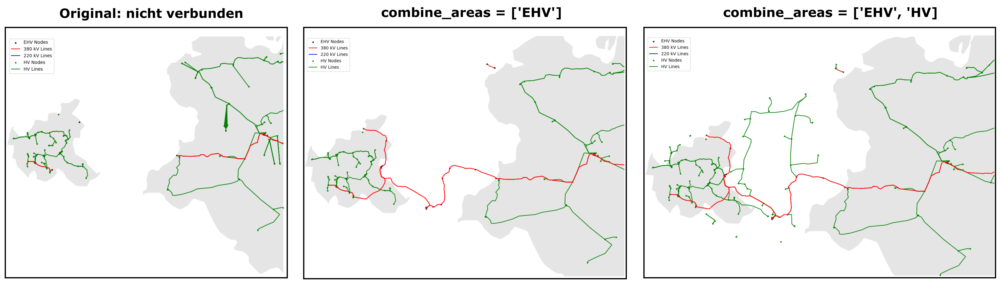

### 2. Power components options

**Format**: Boolean (default: True)
    
You have the possibility to decide which power components should implemented in the grid model. The following are available: 

1. transformers
2. renewable_powerplants
3. conventional_powerplants
4. loads

### 3. Gas components options

**Format**: Boolean (default: True)

**Note**: At this time there are no gas components availible. The following will coming soon:

1. compressors
2. sources
3. storages_gas

## Run main function

After the decription of all possible parameters that can be hand over to the DaVe main function, here are examples how to call this function. You can adapt the parameters so that they suitable for your own grid model requirement.

In [ ]:
# Example 1
grid_data = create_grid(federal_state=['Hessen', 'Thüringen'],
                        power_levels=['EHV', 'HV'],
                        gas_levels=['HP'],
                        plot=False,
                        convert = False,
                        opt_model = False,
                        conventional_powerplants=False,
                        loads=False)

# Example 2 (if you want that DaVe convert the data you need a additional output variable)
grid_data, net_power  = create_grid(town_name=['Kassel'],
                                    power_levels=['MV'],
                                    opt_model = False,
                                    renewable_powerplants=False,
                                    conventional_powerplants=False,
                                    loads=False)

# Example 3 
grid_data, net_power  = create_grid(own_area=_own_area,  # own area from the above example
                                    power_levels=['LV'],
                                    opt_model = False)



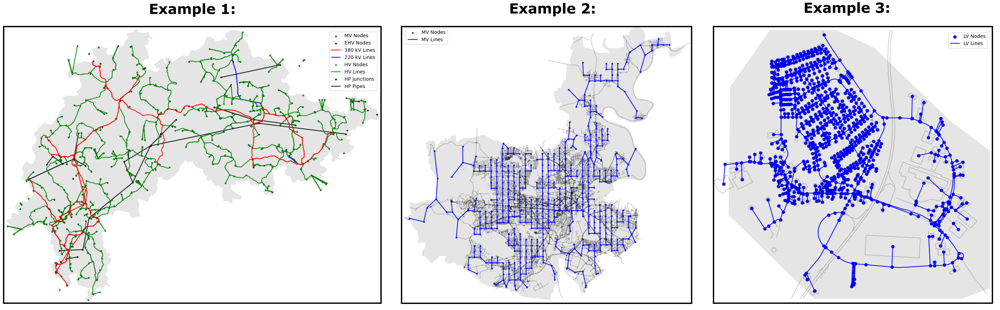

## Runtime

Depending on the choosen model conditions it can take a long time for DaVe to generate the required model. To get a feeling how much time would be needed the runtime for the examples ist listed below. For the runtime your system plays a big role so the given times can be deviate.

- Example 1: ca. 26 min
- Example 2: ca 146 min
- Example 3: ca. 23 min

## Output

When DaVe is finished with the generation of the grid model the results will be saved in the DaVe output folder. This folder will be created at the user desktop by default. If you want to change the path of this folder you can do this within the main init file (`\dave\dave\__init__.py`). The following files you could find in this folder: 

1. dave_dataset.h5 (The origin dataset for the model as hdf5 file)
2. dave_power_grid.json (The converted pandapower model as json file)
3. grid_data.svg / target_area.svg (Plots for a geographical overview as vector file)

##  Feedback 

If you have any critique, ideas or wishes please write a issue whithin the DaVe gitlab repositorys. The DaVe development would be very happy.  